In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px

In [ ]:
data = pd.read_csv(r"/content/dataset.csv")
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [ ]:
data.rename(columns={'County': 'Country'}, inplace=True)

In [ ]:
data.shape

(112634, 17)

In [ ]:
data.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   Country                                            112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [ ]:
# Check for missing values
print("Missing values count:")
print(data.isna().sum().sort_values(ascending=False))

Missing values count:
Electric Utility                                     443
Legislative District                                 286
Vehicle Location                                      24
Model                                                 20
VIN (1-10)                                             0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
DOL Vehicle ID                                         0
Base MSRP                                              0
Electric Range                                         0
Electric Vehicle Type                                  0
Country                                                0
Make                                                   0
Model Year                                             0
Postal Code                                            0
State                                                  0
City                                                   0
2020 Census Tract                                      0
dtype: in

In [ ]:
#Remove Missing Values
data.dropna(inplace=True)
data.reset_index(drop=True, inplace=True)
print("Missing values count:")
print(data.isna().sum().sort_values(ascending=False))

Missing values count:
VIN (1-10)                                           0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Utility                                     0
Vehicle Location                                     0
DOL Vehicle ID                                       0
Legislative District                                 0
Base MSRP                                            0
Electric Range                                       0
Electric Vehicle Type                                0
Country                                              0
Model                                                0
Make                                                 0
Model Year                                           0
Postal Code                                          0
State                                                0
City                                                 0
2020 Census Tract                                    0
dtype: int64


In [ ]:
data.shape

(112152, 17)

In [ ]:
# Count the number of unique values in each column
count = {}

for col in data.columns:
    count[col] = data[col].nunique()

for idx, element in count.items():
  print(f"{idx}: {element}")

VIN (1-10): 7522
Country: 39
City: 435
State: 1
Postal Code: 516
Model Year: 20
Make: 34
Model: 114
Electric Vehicle Type: 2
Clean Alternative Fuel Vehicle (CAFV) Eligibility: 3
Electric Range: 101
Base MSRP: 30
Legislative District: 49
DOL Vehicle ID: 112152
Vehicle Location: 516
Electric Utility: 73
2020 Census Tract: 1760


In [ ]:
numerical_columns = data.select_dtypes(include=['number']).columns
print(numerical_columns)

Index(['Postal Code', 'Model Year', 'Electric Range', 'Base MSRP',
       'Legislative District', 'DOL Vehicle ID', '2020 Census Tract'],
      dtype='object')


In [ ]:
categorical_columns = data.select_dtypes(exclude=['number']).columns
print(categorical_columns)

Index(['VIN (1-10)', 'Country', 'City', 'State', 'Make', 'Model',
       'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Vehicle Location',
       'Electric Utility'],
      dtype='object')


## Univariate Analysis

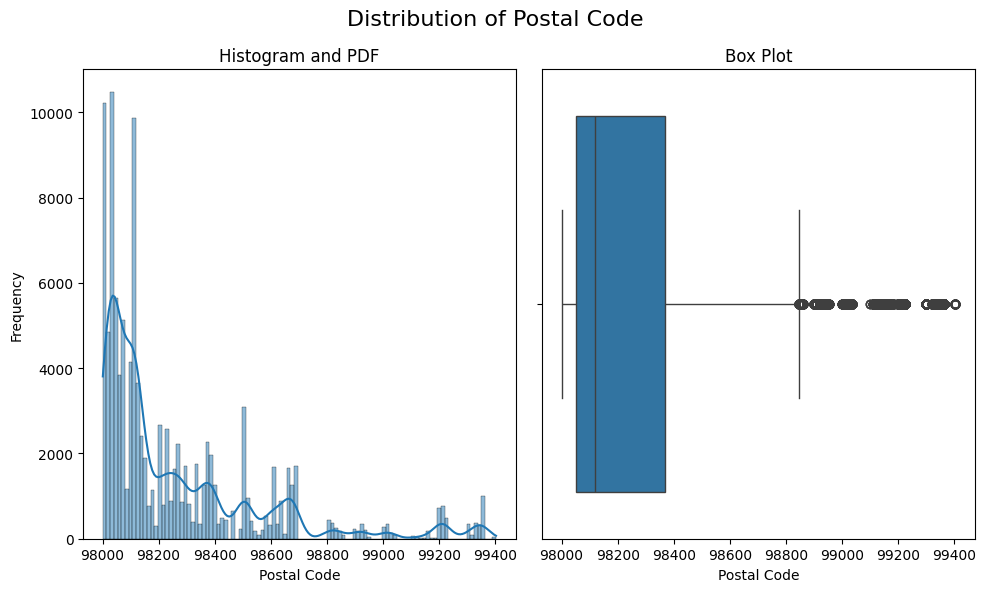

Observations for Postal Code:
- The distribution appears to be skewed.
- The mean value is 98258.86 and the median is 98121.00.
- The data ranges from 98001.00 to 99403.00.
- Skewness: 1.83
- Kurtosis: 3.13
- The interquartile range (IQR) is 318.00
- There are 6514 outliers identified.




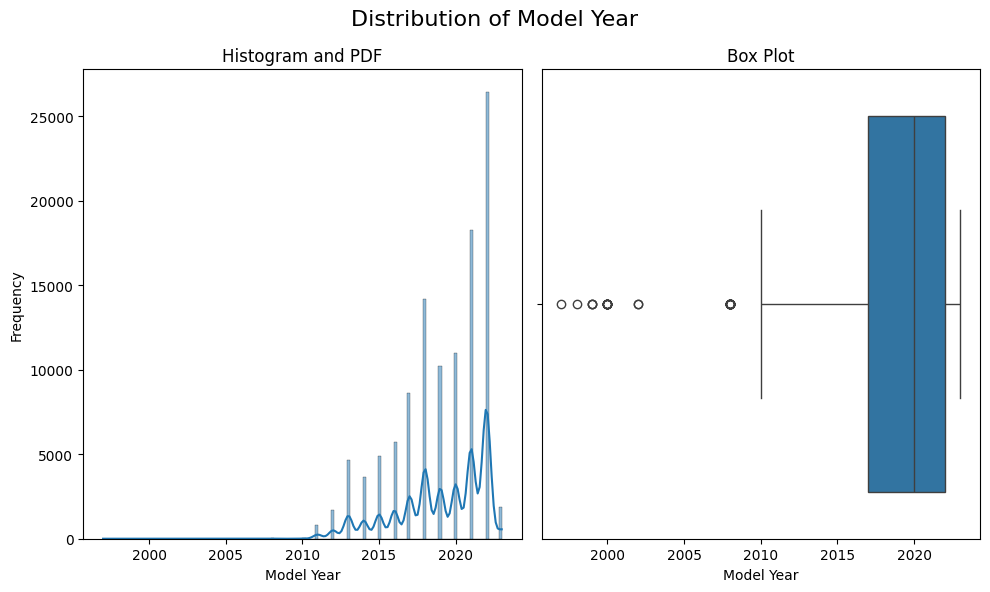

Observations for Model Year:
- The distribution appears to be skewed.
- The mean value is 2019.00 and the median is 2020.00.
- The data ranges from 1997.00 to 2023.00.
- Skewness: -0.82
- Kurtosis: 0.00
- The interquartile range (IQR) is 5.00
- There are 40 outliers identified.




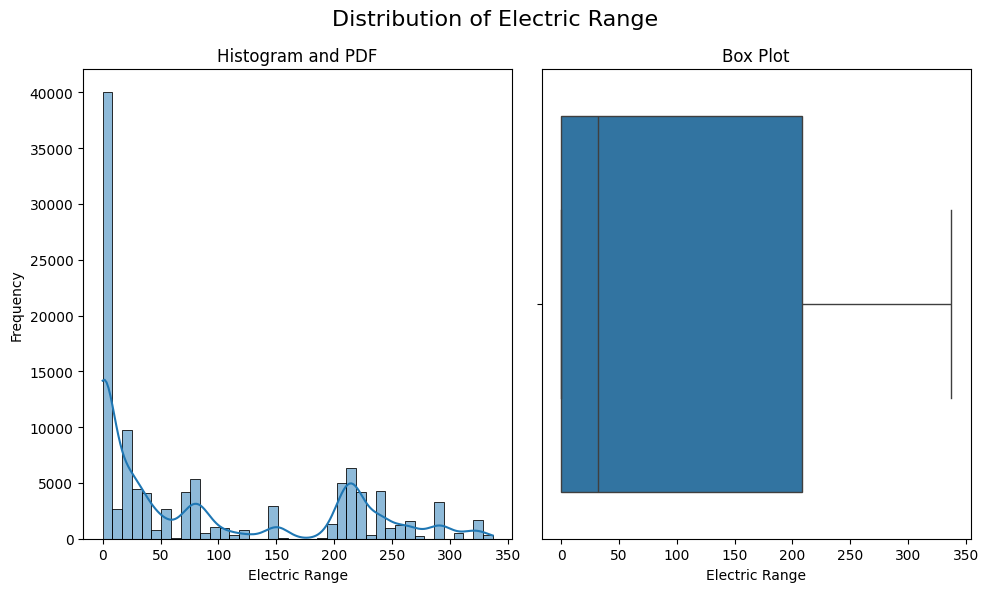

Observations for Electric Range:
- The distribution appears to be skewed.
- The mean value is 87.83 and the median is 32.00.
- The data ranges from 0.00 to 337.00.
- Skewness: 0.82
- Kurtosis: -0.88
- The interquartile range (IQR) is 208.00
- There are 0 outliers identified.




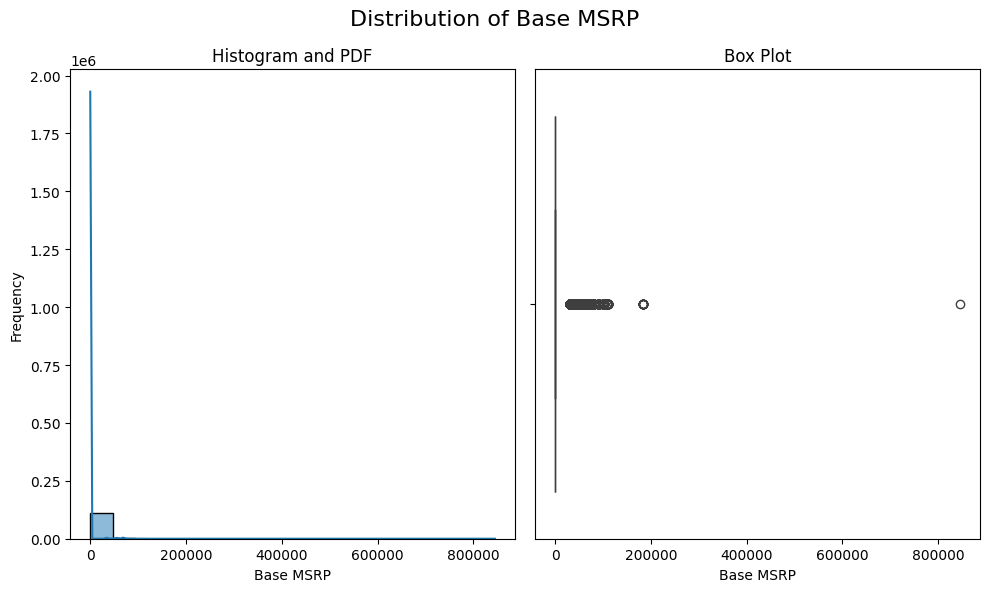

Observations for Base MSRP:
- The distribution appears to be skewed.
- The mean value is 1793.88 and the median is 0.00.
- The data ranges from 0.00 to 845000.00.
- Skewness: 10.11
- Kurtosis: 372.91
- The interquartile range (IQR) is 0.00
- There are 3498 outliers identified.




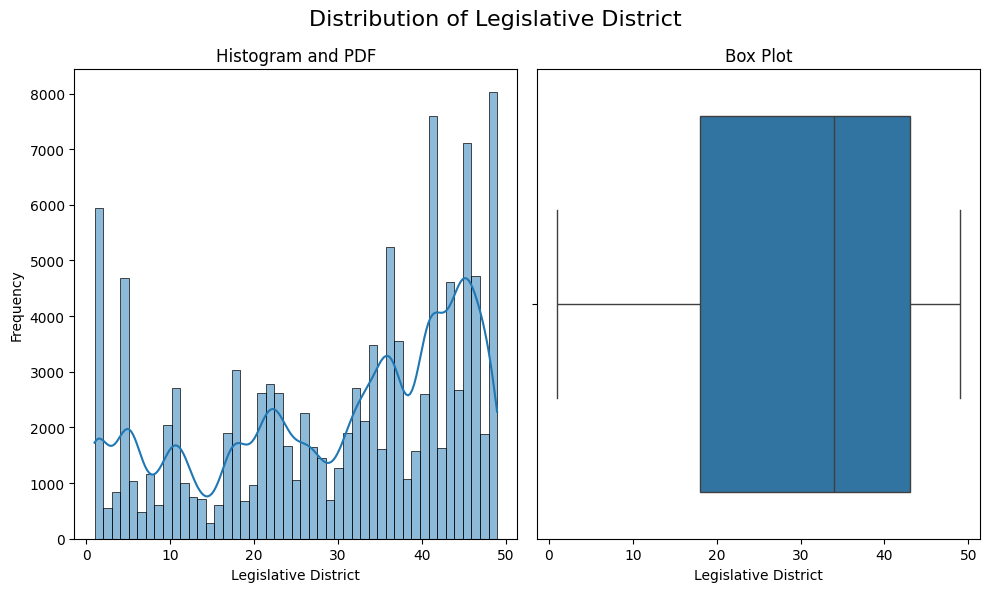

Observations for Legislative District:
- The distribution appears to be skewed.
- The mean value is 29.82 and the median is 34.00.
- The data ranges from 1.00 to 49.00.
- Skewness: -0.54
- Kurtosis: -0.98
- The interquartile range (IQR) is 25.00
- There are 0 outliers identified.




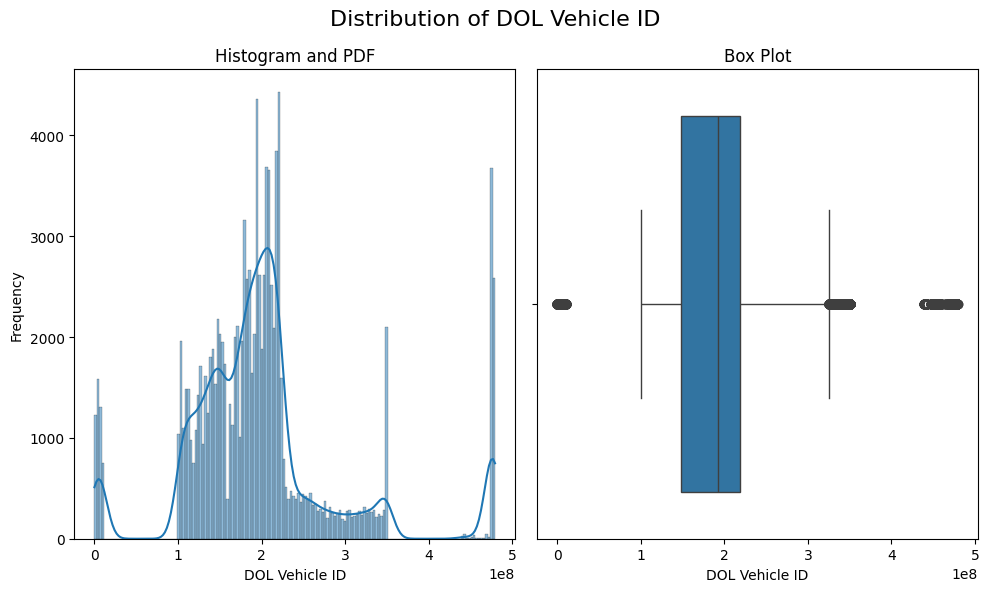

Observations for DOL Vehicle ID:
- The distribution appears to be skewed.
- The mean value is 199471226.93 and the median is 192391604.50.
- The data ranges from 4777.00 to 479254772.00.
- Skewness: 1.15
- Kurtosis: 2.46
- The interquartile range (IQR) is 70772079.00
- There are 15483 outliers identified.




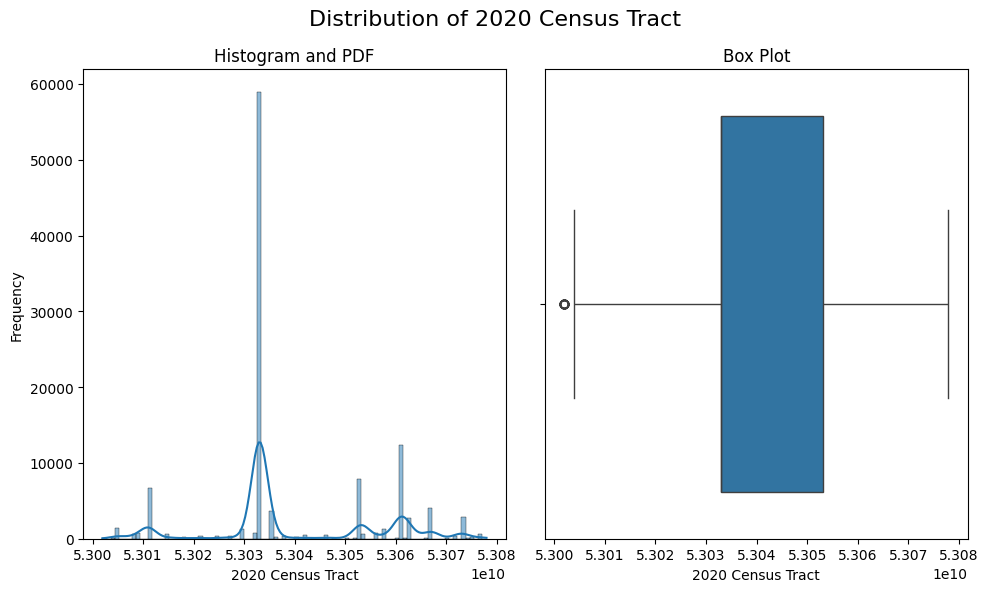

Observations for 2020 Census Tract:
- The distribution appears to be symmetric.
- The mean value is 53039581729.10 and the median is 53033029307.00.
- The data ranges from 53001950100.00 to 53077940007.00.
- Skewness: 0.31
- Kurtosis: -0.39
- The interquartile range (IQR) is 20063806.00
- There are 34 outliers identified.




In [ ]:
# Function to plot histograms and box plots side by side for numerical columns
def plot_hist_and_box(df, columns):
    for col in columns:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))
        fig.suptitle(f'Distribution of {col}', fontsize=16)
        sns.histplot(df[col], kde=True, ax=ax1)
        ax1.set_title('Histogram and PDF')
        ax1.set_xlabel(col)
        ax1.set_ylabel('Frequency')
        sns.boxplot(x=df[col], ax=ax2)
        ax2.set_title('Box Plot')
        ax2.set_xlabel(col)
        plt.tight_layout()
        plt.show()
        print(f"Observations for {col}:")
        print(f"- The distribution appears to be {'symmetric' if abs(df[col].skew()) < 0.5 else 'skewed'}.")
        print(f"- The mean value is {df[col].mean():.2f} and the median is {df[col].median():.2f}.")
        print(f"- The data ranges from {df[col].min():.2f} to {df[col].max():.2f}.")
        print(f"- Skewness: {df[col].skew():.2f}")
        print(f"- Kurtosis: {df[col].kurtosis():.2f}")
        q1, q3 = df[col].quantile([0.25, 0.75])
        iqr = q3 - q1
        lower_bound = q1 - (1.5 * iqr)
        upper_bound = q3 + (1.5 * iqr)
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        print(f"- The interquartile range (IQR) is {iqr:.2f}")
        print(f"- There are {len(outliers)} outliers identified.")
        print("\n")

# Plot histograms with PDF and box plots for numerical columns
plot_hist_and_box(data, numerical_columns)

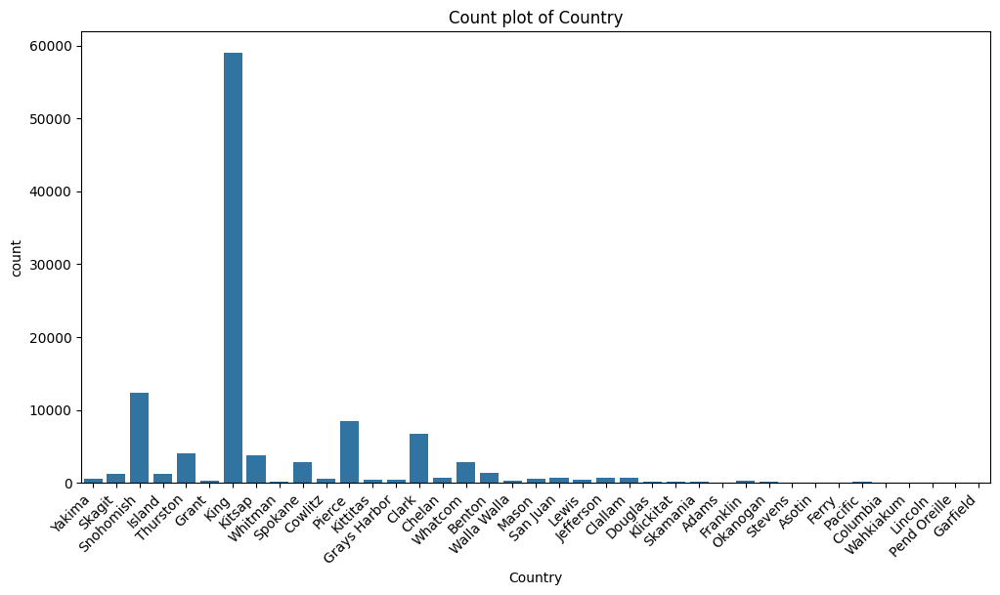

Observations for Country count plot:
- The most frequent category is 'King' with 58980 occurrences.
- The least frequent category is 'Garfield' with 4 occurrences.
- There are 39 unique categories.




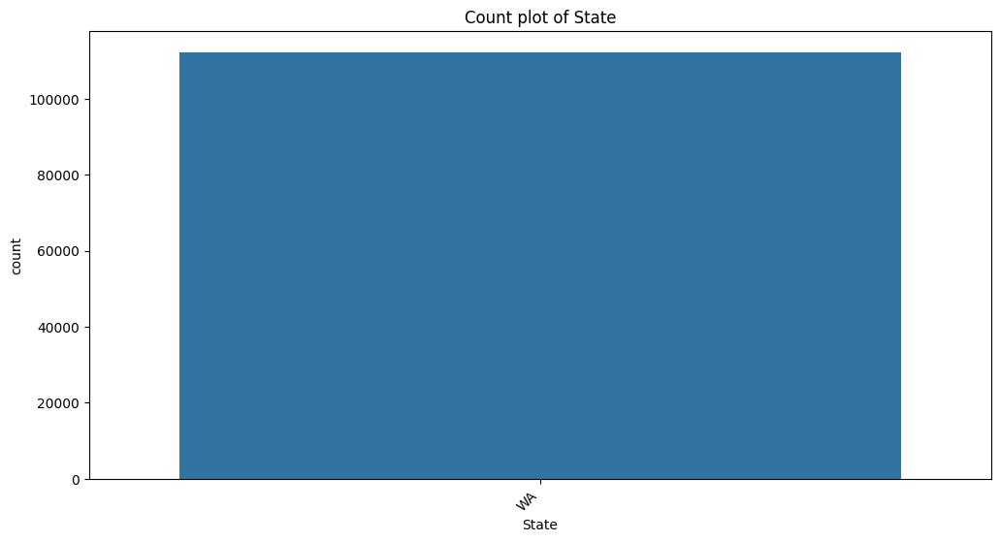

Observations for State count plot:
- The most frequent category is 'WA' with 112152 occurrences.
- The least frequent category is 'WA' with 112152 occurrences.
- There are 1 unique categories.




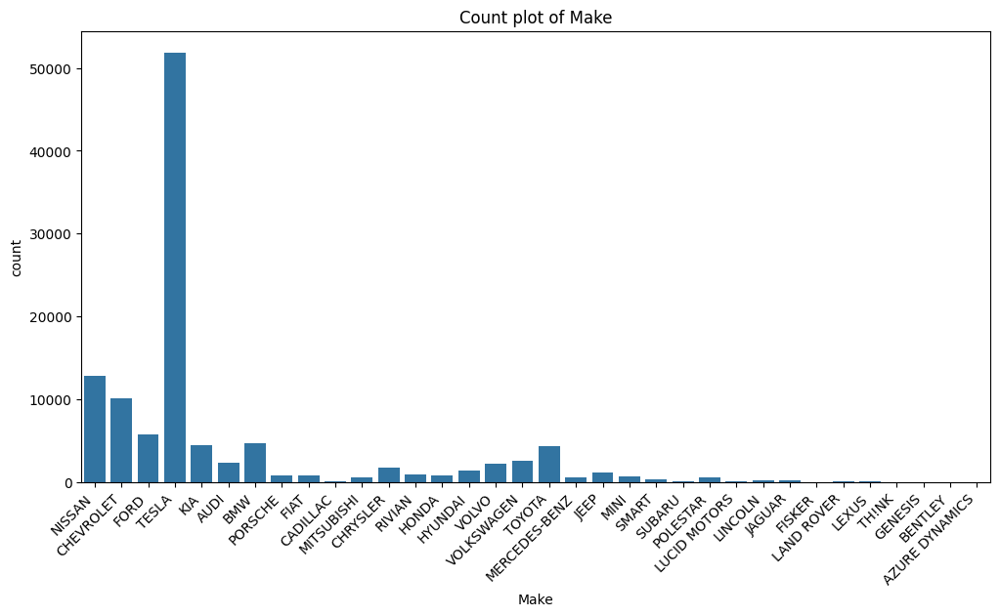

Observations for Make count plot:
- The most frequent category is 'TESLA' with 51883 occurrences.
- The least frequent category is 'BENTLEY' with 3 occurrences.
- There are 34 unique categories.




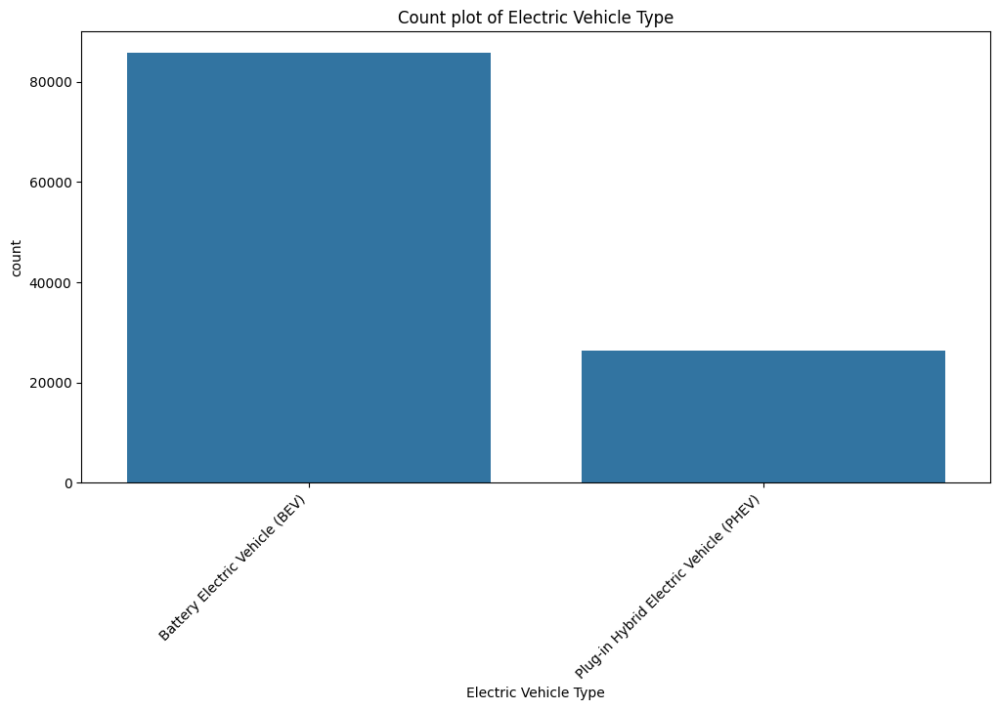

Observations for Electric Vehicle Type count plot:
- The most frequent category is 'Battery Electric Vehicle (BEV)' with 85732 occurrences.
- The least frequent category is 'Plug-in Hybrid Electric Vehicle (PHEV)' with 26420 occurrences.
- There are 2 unique categories.




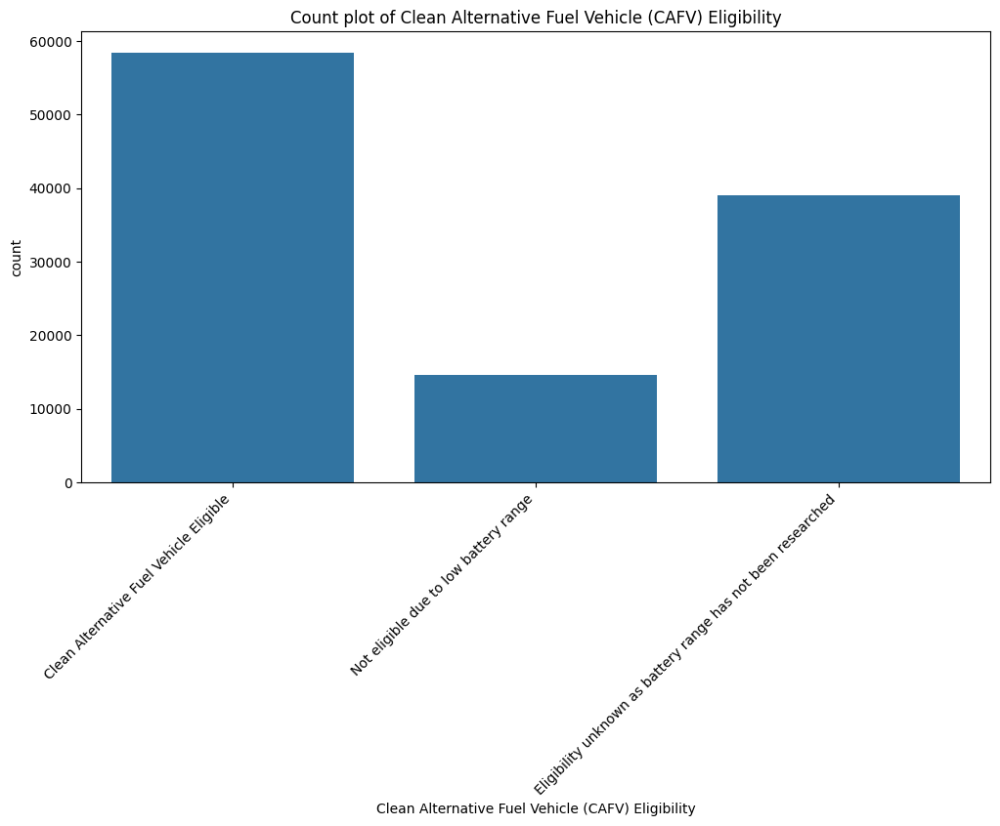

Observations for Clean Alternative Fuel Vehicle (CAFV) Eligibility count plot:
- The most frequent category is 'Clean Alternative Fuel Vehicle Eligible' with 58395 occurrences.
- The least frequent category is 'Not eligible due to low battery range' with 14660 occurrences.
- There are 3 unique categories.




In [ ]:
# Function to plot count plots for categorical columns
def plot_countplots(df, columns):
    for col in columns:
        if data[col].nunique()<=50:
            plt.figure(figsize=(12, 6))
            sns.countplot(x=col, data=df)
            plt.title(f'Count plot of {col}')
            plt.xticks(rotation=45, ha='right')
            plt.show()
            print(f"Observations for {col} count plot:")
            value_counts = df[col].value_counts()
            print(f"- The most frequent category is '{value_counts.index[0]}' with {value_counts.iloc[0]} occurrences.")
            print(f"- The least frequent category is '{value_counts.index[-1]}' with {value_counts.iloc[-1]} occurrences.")
            print(f"- There are {df[col].nunique()} unique categories.")
            print("\n")

# Plot count plots for categorical columns
plot_countplots(data, categorical_columns)

## Key Observations:
- Tesla dominates the market with nearly half of the vehicles in the dataset.
- Battery Electric Vehicles (BEVs) are more common than Plug-in Hybrid Electric Vehicles (PHEVs).
- There's a wide range of electric ranges, from 0 to 337 miles.
- The Base MSRP shows extreme variation, with some very high-priced vehicles causing a strong right skew.
- The data spans from very old models (1997) to the latest models (2023), with a concentration on newer vehicles.
- King County has the highest number of electric vehicles by far.

In [ ]:
# Find outliers in numerical columns
for col in numerical_columns:
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    print(f"\nOutliers in {col}:")
    print(outliers[col])
    print(f"Number of outliers: {len(outliers)}")
    print(f"Percentage of outliers: {(len(outliers) / len(data)) * 100:.2f}%")
    print("\n")


Outliers in Postal Code:
0         98901
26        98901
35        98902
36        98908
37        99163
          ...  
111976    98930
111981    99207
112011    99212
112035    99354
112119    99218
Name: Postal Code, Length: 6514, dtype: int64
Number of outliers: 6514
Percentage of outliers: 5.81%



Outliers in Model Year:
14060     2008
14794     2000
23460     2008
23629     2000
28440     1997
30255     2008
39606     1999
39620     2008
43518     2008
48018     2000
49706     1999
50799     2000
50929     2000
51402     2008
51683     2008
52074     2008
53289     2008
53872     2008
55461     2008
62222     2008
64504     2008
65837     2008
66740     2008
66993     1998
72401     2008
74264     2008
74678     2008
77775     2008
79796     2000
81413     2008
82524     2008
84068     2000
84699     2000
86384     2000
88710     2008
92415     2002
94728     2000
99261     2002
109840    1999
111757    2008
Name: Model Year, dtype: int64
Number of outliers: 40
Percentage of ou

# Bivariate Analysis

In [ ]:
def plot_scatter(df, x_col, y_col):
    fig, ax = plt.subplots(figsize=(12, 8))
    fig.suptitle(f'Relationship between {x_col} and {y_col}', fontsize=16)
    sns.scatterplot(data=df, x=x_col, y=y_col, ax=ax)
    ax.set_title('Scatter Plot')
    plt.tight_layout()
    plt.show()
    correlation = df[x_col].corr(df[y_col])
    print(f"Observations for {x_col} vs {y_col}:")
    print(f"- The correlation coefficient is {correlation:.2f}")
    print(f"- There appears to be a {'positive' if correlation > 0 else 'negative'} {'strong' if abs(correlation) > 0.5 else 'weak'} relationship.")
    print("\n")

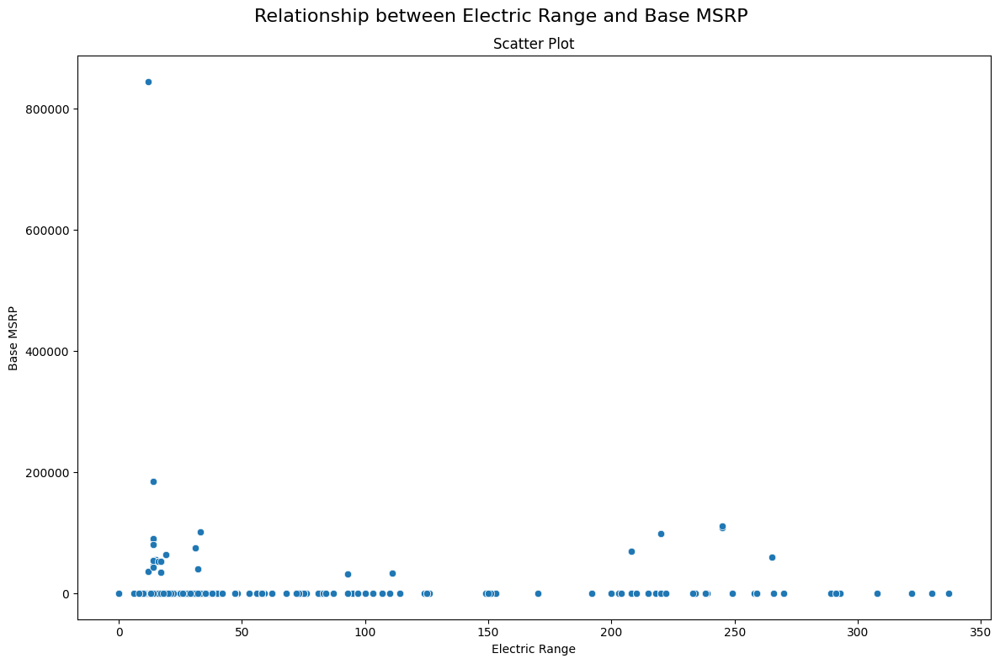

Observations for Electric Range vs Base MSRP:
- The correlation coefficient is 0.09
- There appears to be a positive weak relationship.




In [ ]:
plot_scatter(data,'Electric Range','Base MSRP')

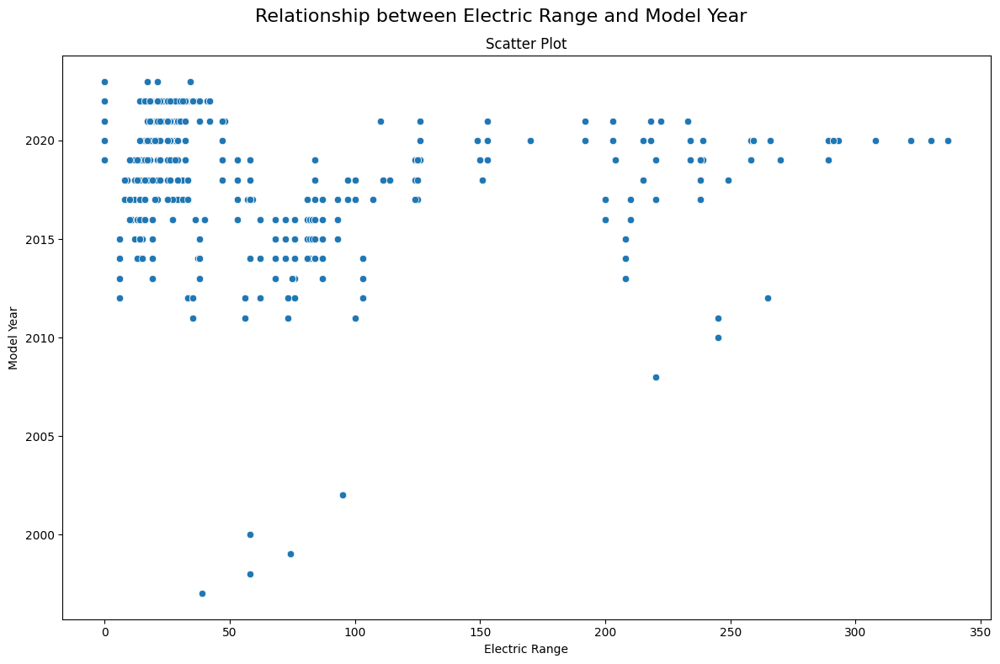

Observations for Electric Range vs Model Year:
- The correlation coefficient is -0.29
- There appears to be a negative weak relationship.




In [ ]:
plot_scatter(data,'Electric Range','Model Year')

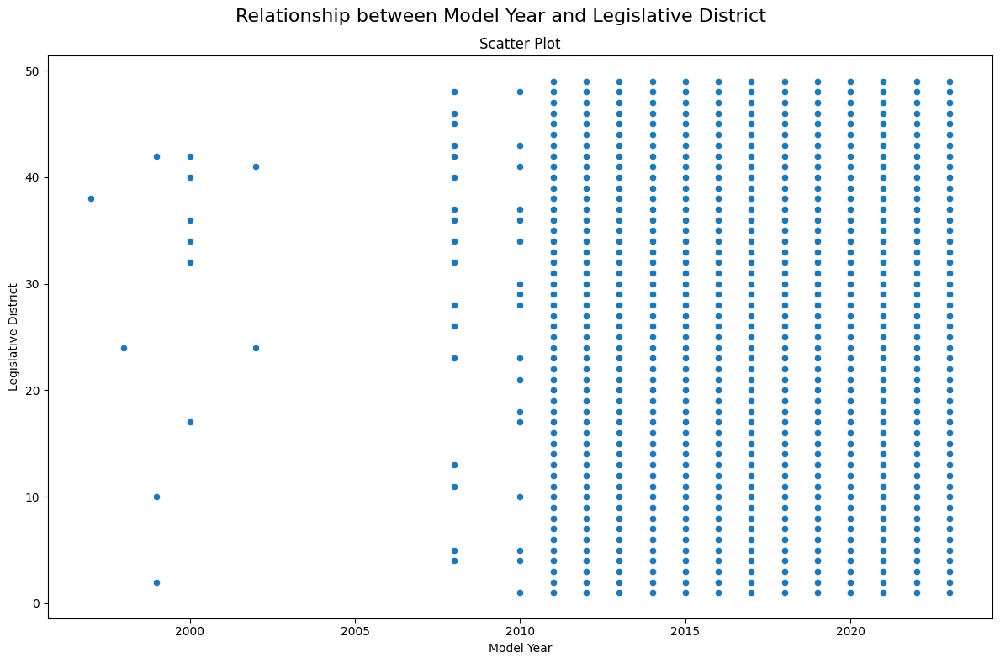

Observations for Model Year vs Legislative District:
- The correlation coefficient is 0.01
- There appears to be a positive weak relationship.




In [ ]:
plot_scatter(data,'Model Year','Legislative District')

In [ ]:
# Function to plot stacked bar plots for categorical-categorical relationships
def plot_stacked_bar(df, cat_col1, cat_col2):
    contingency_table = pd.crosstab(df[cat_col1], df[cat_col2], normalize='index')
    contingency_table.plot(kind='bar', stacked=True, figsize=(12, 6))
    plt.title(f'Stacked Bar plot of {cat_col1} vs {cat_col2}')
    plt.xlabel(cat_col1)
    plt.ylabel('Proportion')
    plt.legend(title=cat_col2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"Observations for stacked bar plot of {cat_col1} vs {cat_col2}:")
    print(f"- Each bar represents the proportion of categories in {cat_col2} for each category in {cat_col1}.")
    print("- The full height of each bar is 100%.")
    print("\n")

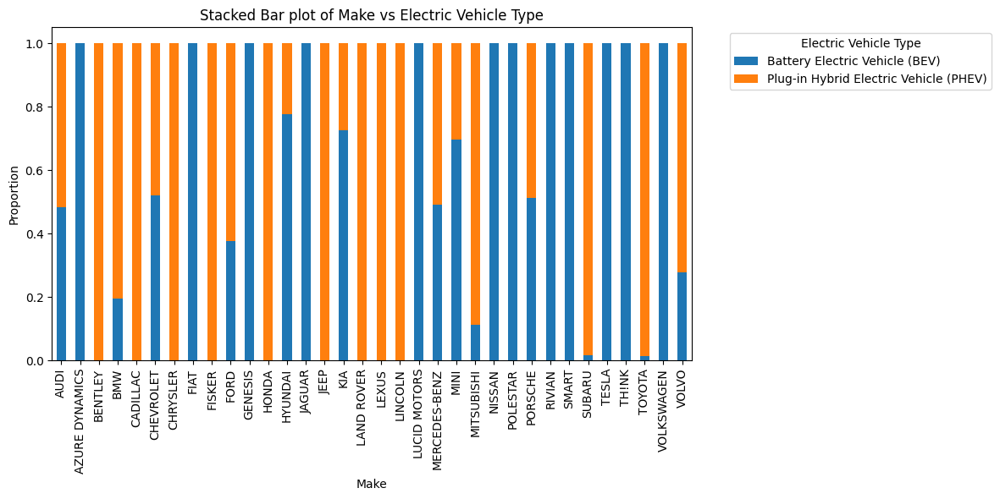

Observations for stacked bar plot of Make vs Electric Vehicle Type:
- Each bar represents the proportion of categories in Electric Vehicle Type for each category in Make.
- The full height of each bar is 100%.




In [ ]:
plot_stacked_bar(data, 'Make', 'Electric Vehicle Type')

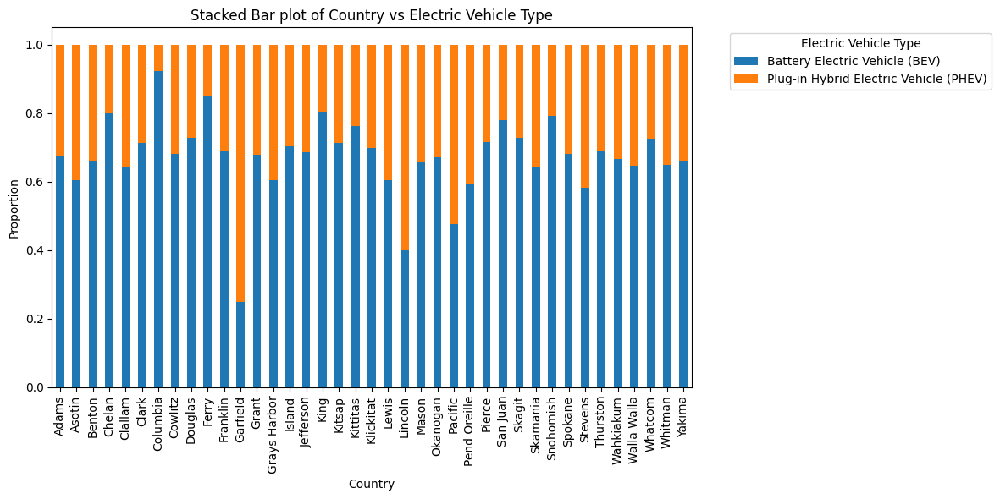

Observations for stacked bar plot of Country vs Electric Vehicle Type:
- Each bar represents the proportion of categories in Electric Vehicle Type for each category in Country.
- The full height of each bar is 100%.




In [ ]:
plot_stacked_bar(data, 'Country', 'Electric Vehicle Type')

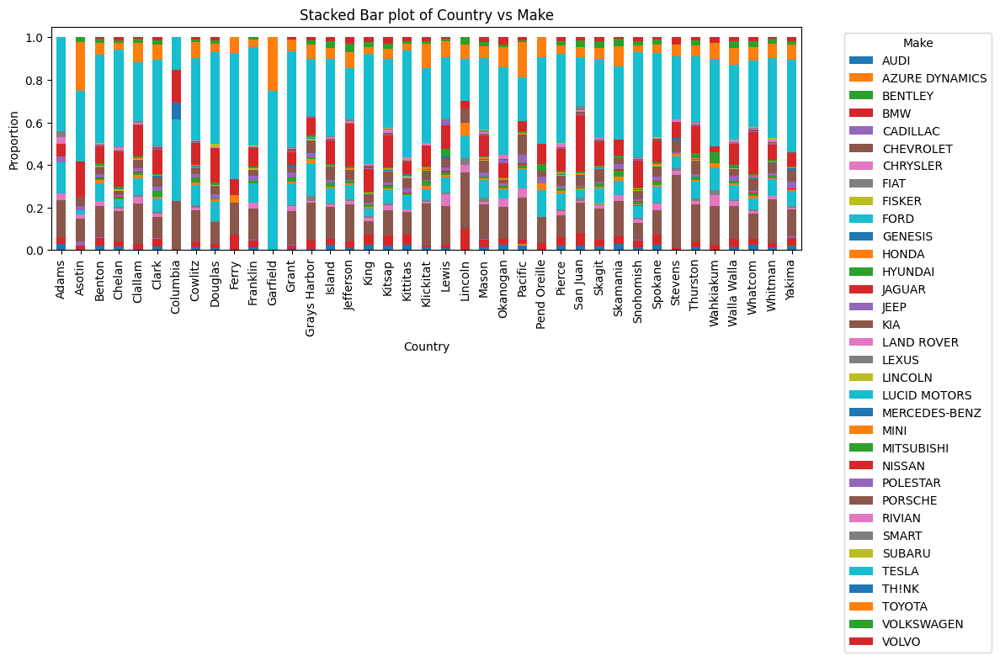

Observations for stacked bar plot of Country vs Make:
- Each bar represents the proportion of categories in Make for each category in Country.
- The full height of each bar is 100%.




In [ ]:
plot_stacked_bar(data, 'Country', 'Make')

In [ ]:
def plot_cat_num(df, cat_col, num_col):
    fig, ax = plt.subplots(figsize=(12, 6))
    fig.suptitle(f'Comparison of {cat_col} vs {num_col}', fontsize=16)
    sns.boxplot(data=df, x=cat_col, y=num_col, ax=ax)
    ax.set_title('Box Plot')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

    plt.tight_layout()
    plt.show()

    print(f"Observations for {cat_col} vs {num_col}:")
    print("- Box Plot: Shows median, quartiles, and potential outliers.")
    print("\n")

<ipython-input-25-1e4fef633303>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


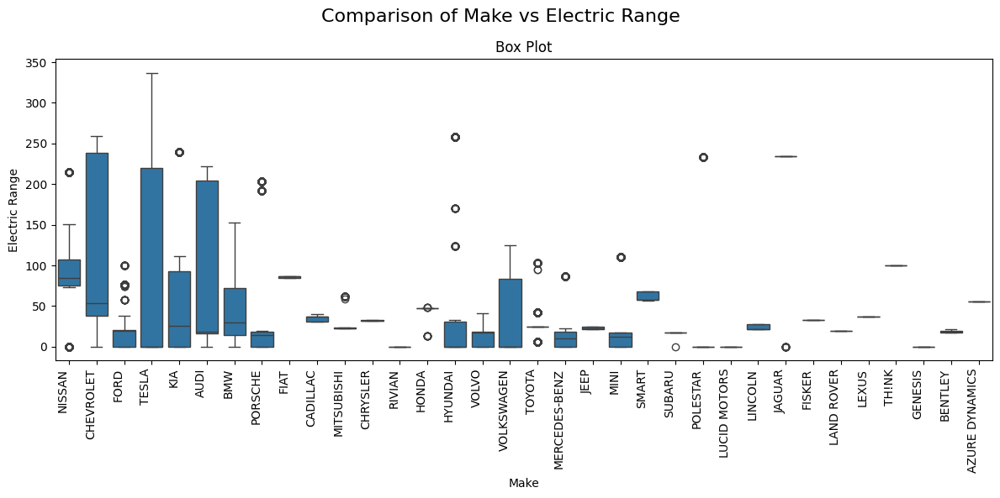

Observations for Make vs Electric Range:
- Box Plot: Shows median, quartiles, and potential outliers.




In [ ]:
plot_cat_num(data, 'Make', 'Electric Range')

<ipython-input-25-1e4fef633303>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


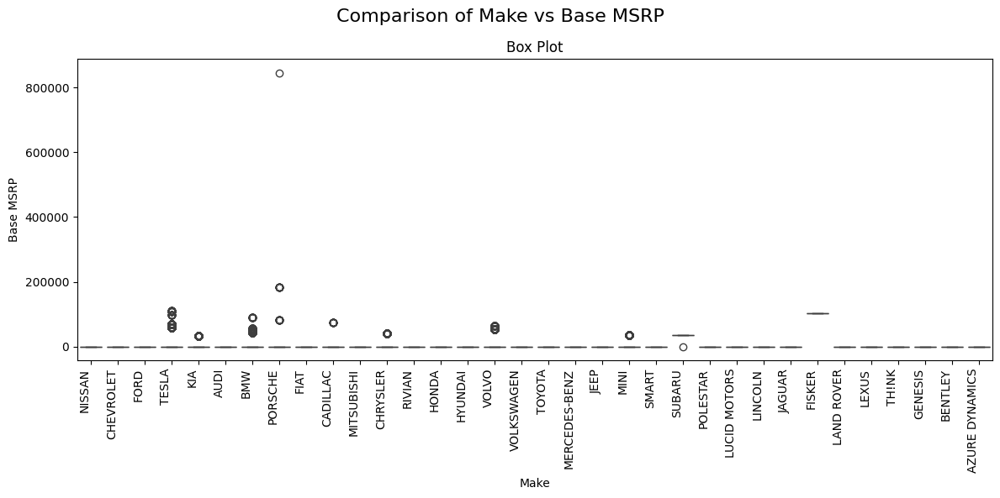

Observations for Make vs Base MSRP:
- Box Plot: Shows median, quartiles, and potential outliers.




In [ ]:
plot_cat_num(data, 'Make', 'Base MSRP')

<ipython-input-25-1e4fef633303>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


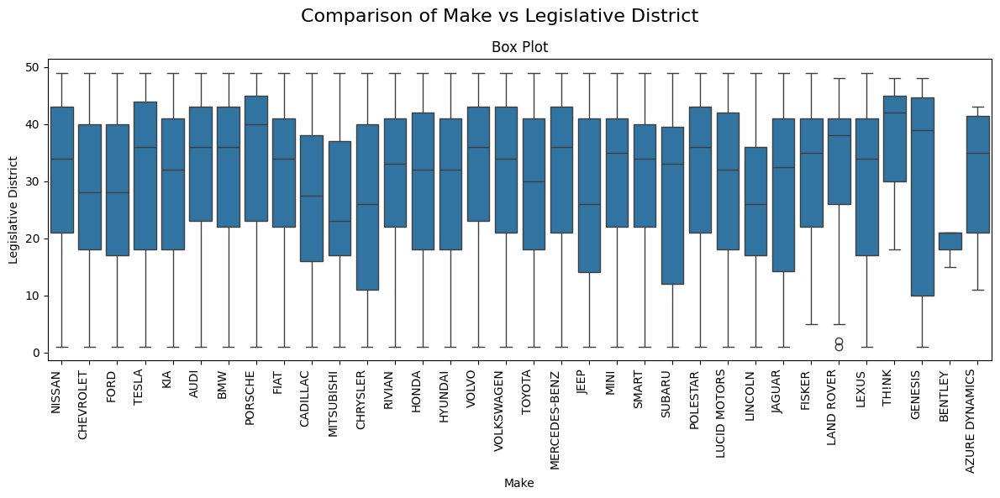

Observations for Make vs Legislative District:
- Box Plot: Shows median, quartiles, and potential outliers.




In [ ]:
plot_cat_num(data, 'Make', 'Legislative District')

<ipython-input-25-1e4fef633303>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


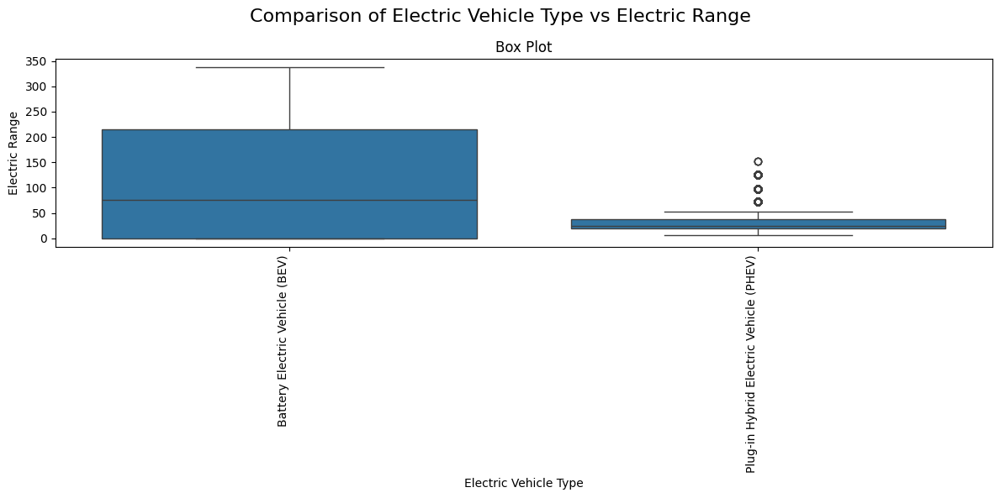

Observations for Electric Vehicle Type vs Electric Range:
- Box Plot: Shows median, quartiles, and potential outliers.




In [ ]:
plot_cat_num(data, 'Electric Vehicle Type', 'Electric Range')

## Key Observations:
- Weak correlations between electric range, price, and model year
- Vehicle makes vary in range, price, and regional distribution
- EV types differ by country and manufacturer
- Electric range varies among different EV types
- Complex factors influence EV characteristics and adoption

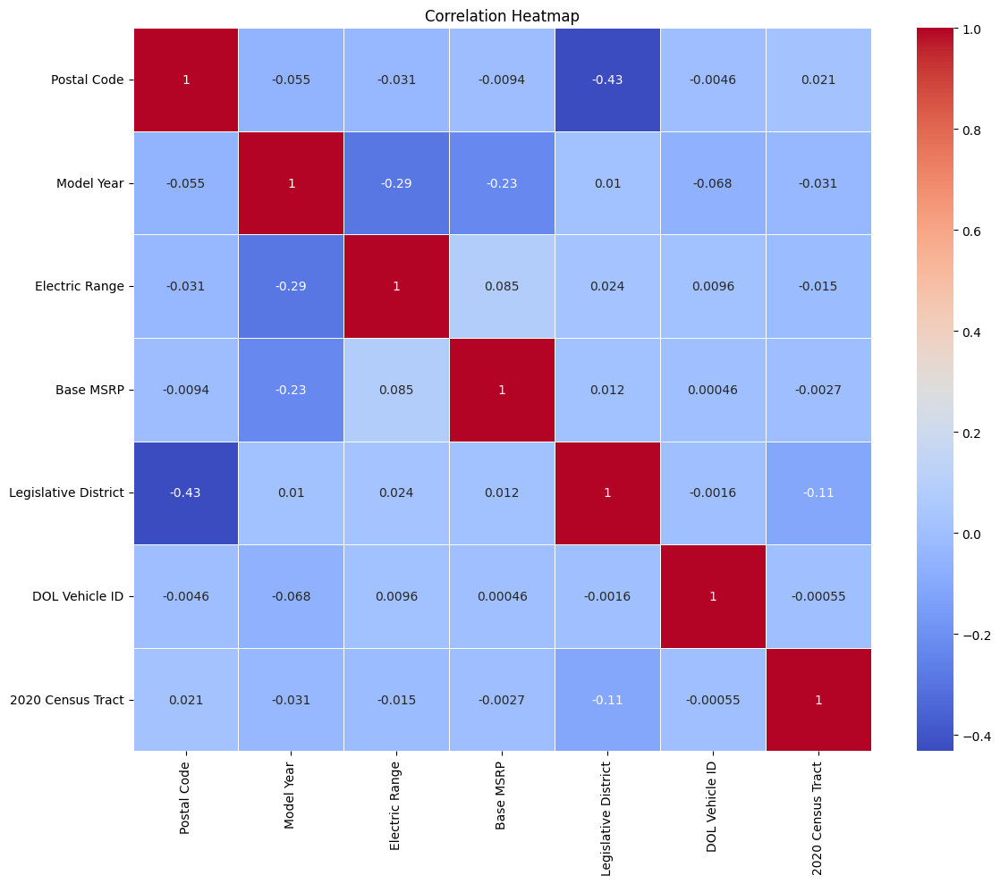

In [ ]:
# Correlation heatmap for numerical columns
plt.figure(figsize=(12, 10))
correlation_matrix = data[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

In [ ]:
temp = data.groupby('State').size().reset_index(name='count')
fig = px.choropleth(temp,
                    locations='State',
                    color='count',
                    hover_name='count',
                    locationmode="USA-states",
                    scope="usa",
                  )
fig.show()

In [ ]:
temp1 = data.groupby(['State', 'Model Year']).size().reset_index(name='count')
fig = px.choropleth(temp1,
                    locations='State',
                    color='count',
                    hover_name='count',
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame='Model Year'
                  )
fig.show()

In [ ]:
final = data.groupby(['Model Year', 'Make']).size().reset_index(name='count')
final.head()

,Model Year,Make,count
0,1997,CHEVROLET,1
1,1998,FORD,1
2,1999,FORD,3
3,2000,FORD,10
4,2002,TOYOTA,2


In [ ]:
bcr.bar_chart_race(
    df=final.pivot_table(index='Model Year', columns='Make', values='count', fill_value=0),
    filename='ev_racing_bar_plot.gif',
    orientation='h',
    sort='desc',
    n_bars=10,
    steps_per_period=45,
    period_length=3000,
    title='Year-wise Sales of Each Electric Vehicle Maker',
    period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 50, 'weight': 'semibold'},
    filter_column_colors=True,
    bar_kwargs={'alpha': .99, 'lw': 0}
)

NameError: name 'bcr' is not defined

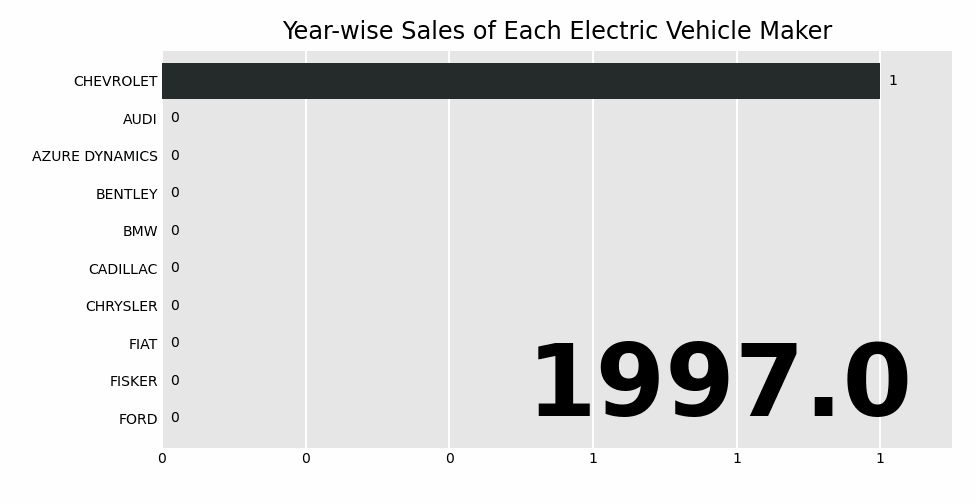

In [ ]:
from IPython.display import Image
Image(filename='/content/ev_racing_bar_plot.gif')